Loading ETH datasets: 100%|██████████| 2/2 [00:00<00:00, 45.75it/s, seq_hotel]


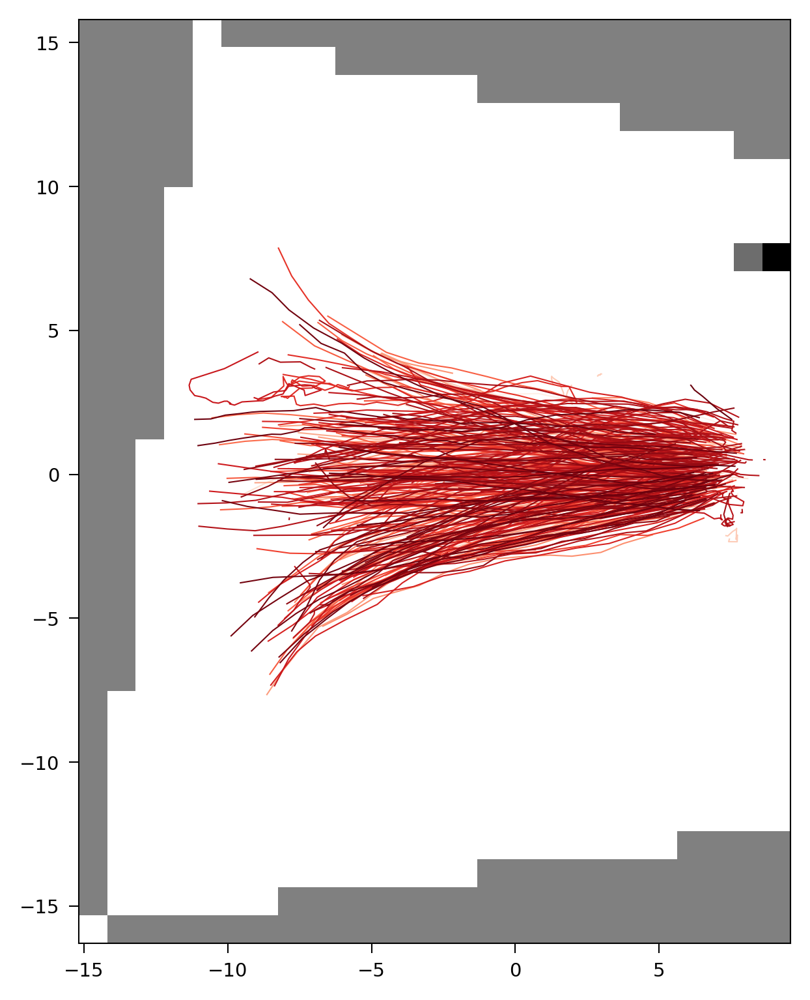

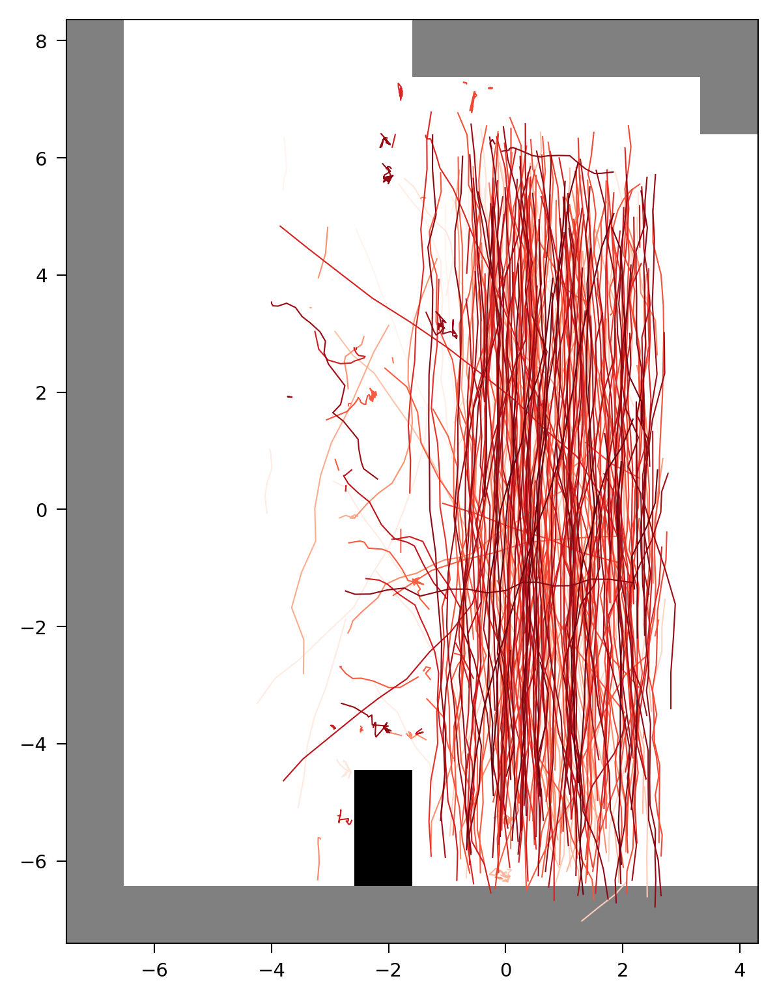

In [ ]:
import matplotlib.pyplot as plt
from pathlib import Path
from argparse import Namespace
from src.dataset import ETHDataset
from src.utils.plot import get_fig
from src.utils.crop_axes_region import crop_axes_region

args = Namespace(
    fps=2.5,
    pred_step=1,
    roll_step=12,
    hist_step=8,
    skip_step=1,
    dot_per_meter=1,
    cache_dataset=True,
)
datasets = ETHDataset.load_data_batch(args, './data/ETH/')

for dataset in datasets:

    fi, fig, axes = get_fig(1, 1, AW=12, AH=12, dpi=300)
    ax = axes[0]    

    ax.set_facecolor('gray')

    map_data = dataset.map_data
    ax.imshow(
        map_data.map.T,
        extent=[map_data.xmin, map_data.xmax, map_data.ymin, map_data.ymax],
        origin='lower',
        cmap='gray_r',
        zorder=0,
    )

    df_data = dataset.df_data
    norm = plt.Normalize(vmin=df_data['f'].min(), vmax=df_data['f'].max())
    cmap = plt.get_cmap('viridis')
    for pid, group in df_data.sort_values(['id', 'f']).groupby('id'):
        assert group['type'].nunique() == 1
        if group['type'].iloc[0] == 'vehicle':
            cmap = plt.get_cmap('Blues')
        elif group['type'].iloc[0] == 'pedestrian':
            cmap = plt.get_cmap('Reds')
        else:
            cmap = plt.get_cmap('Greys')
        color = cmap(norm(group['f'].mean()))
        ax.plot(group['x'], group['y'], color=color, lw=0.5, zorder=999)

    img = crop_axes_region(ax, map_data.xmin, map_data.xmax, map_data.ymin, map_data.ymax, pad_pixels=0, dpi=800)
    img.save(Path(dataset.path).parent / 'demo.png')

Loading UCY datasets: 100%|██████████| 7/7 [00:00<00:00, 66.07it/s, data_zara/crowds_zara03]      


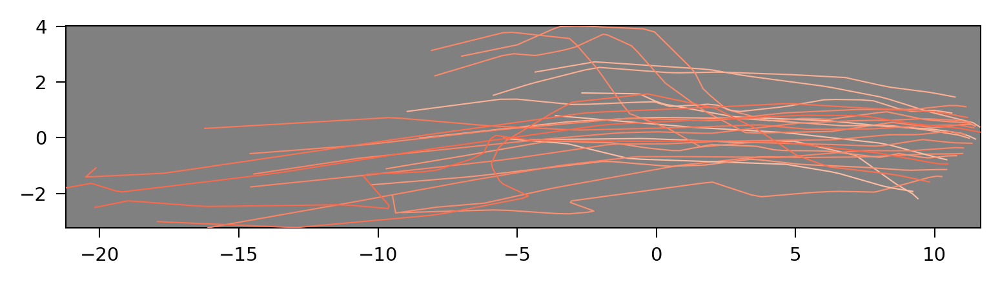

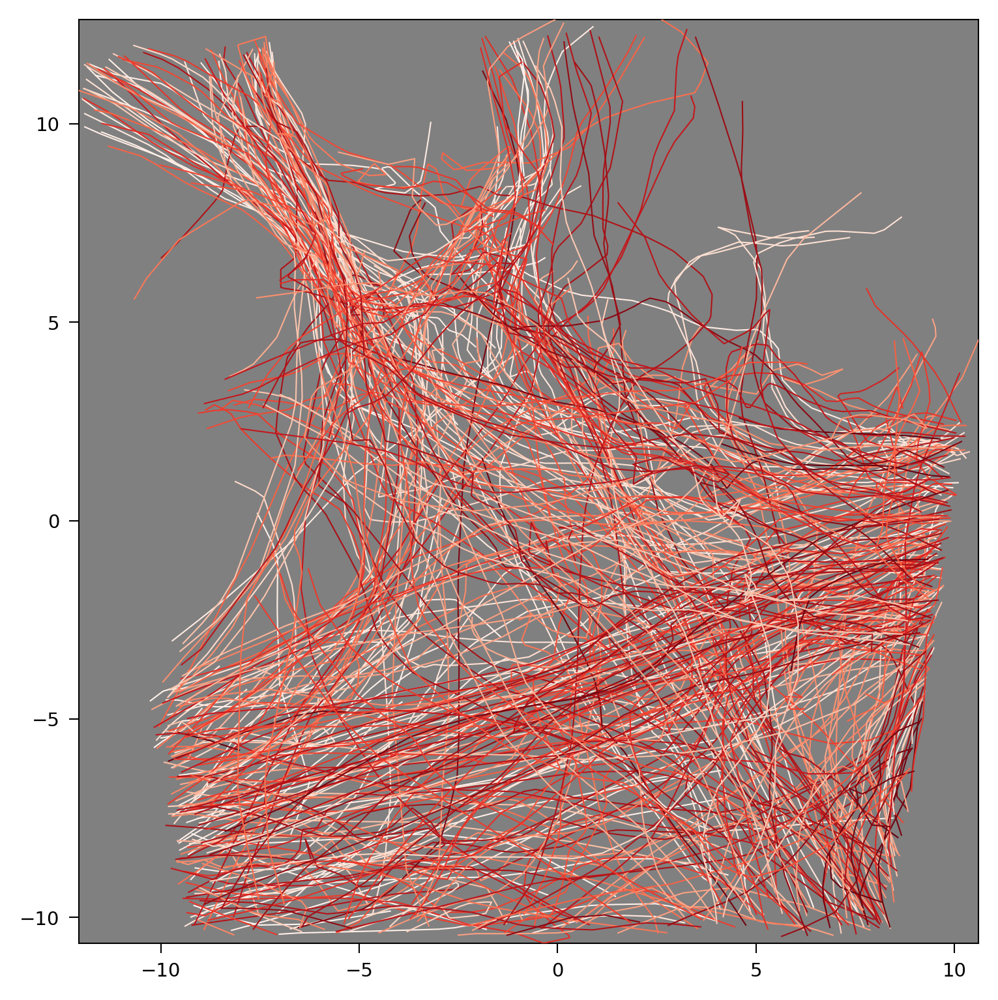

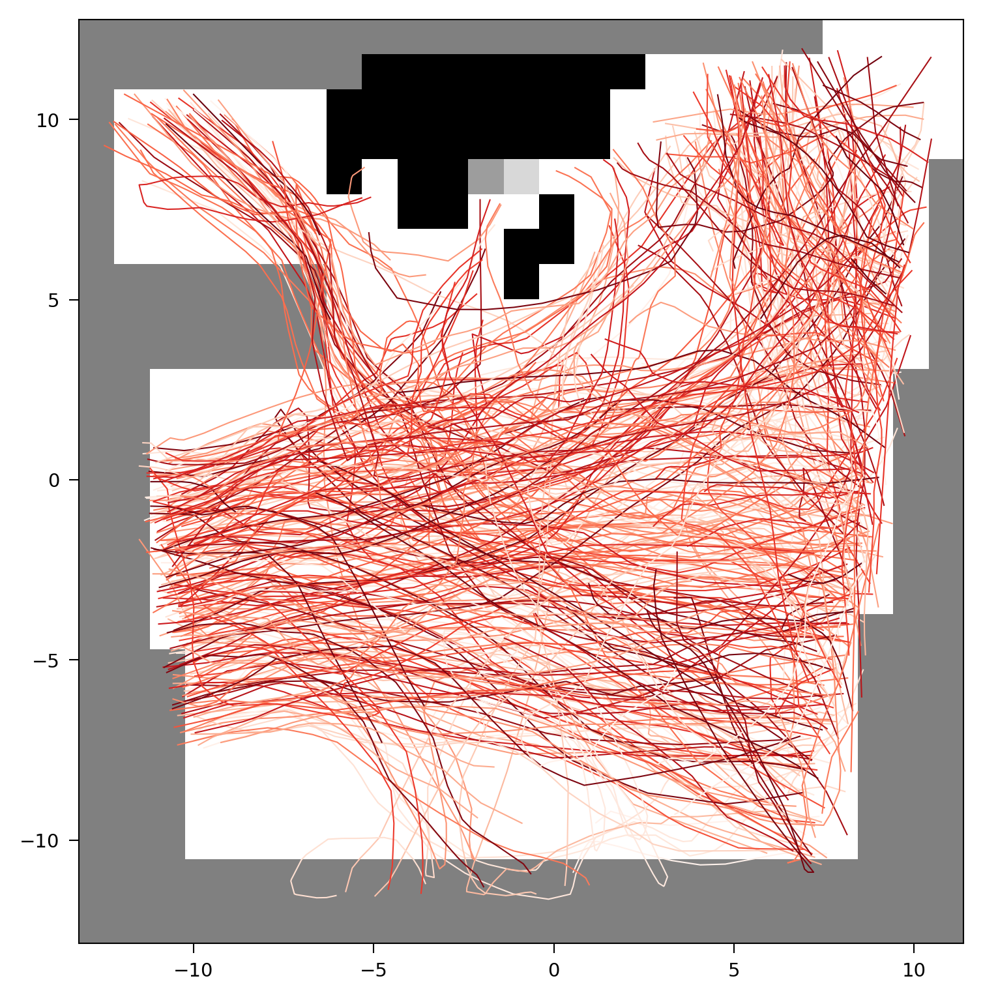

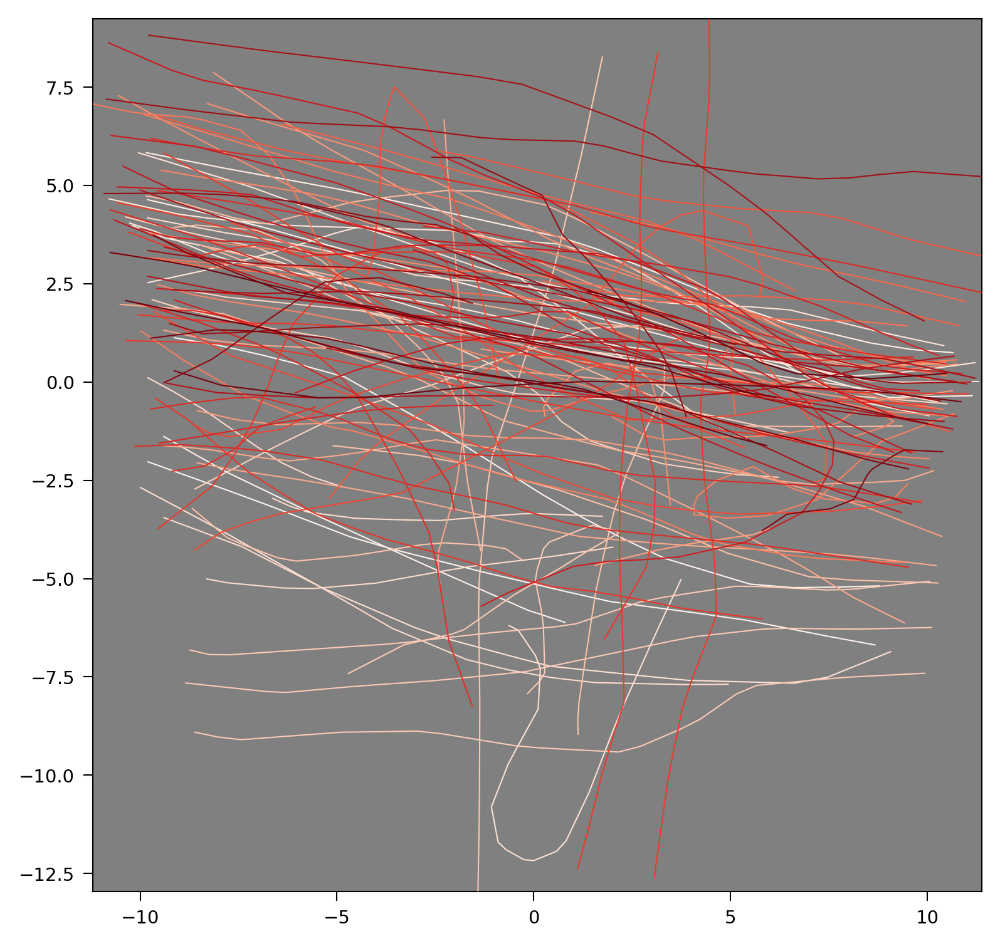

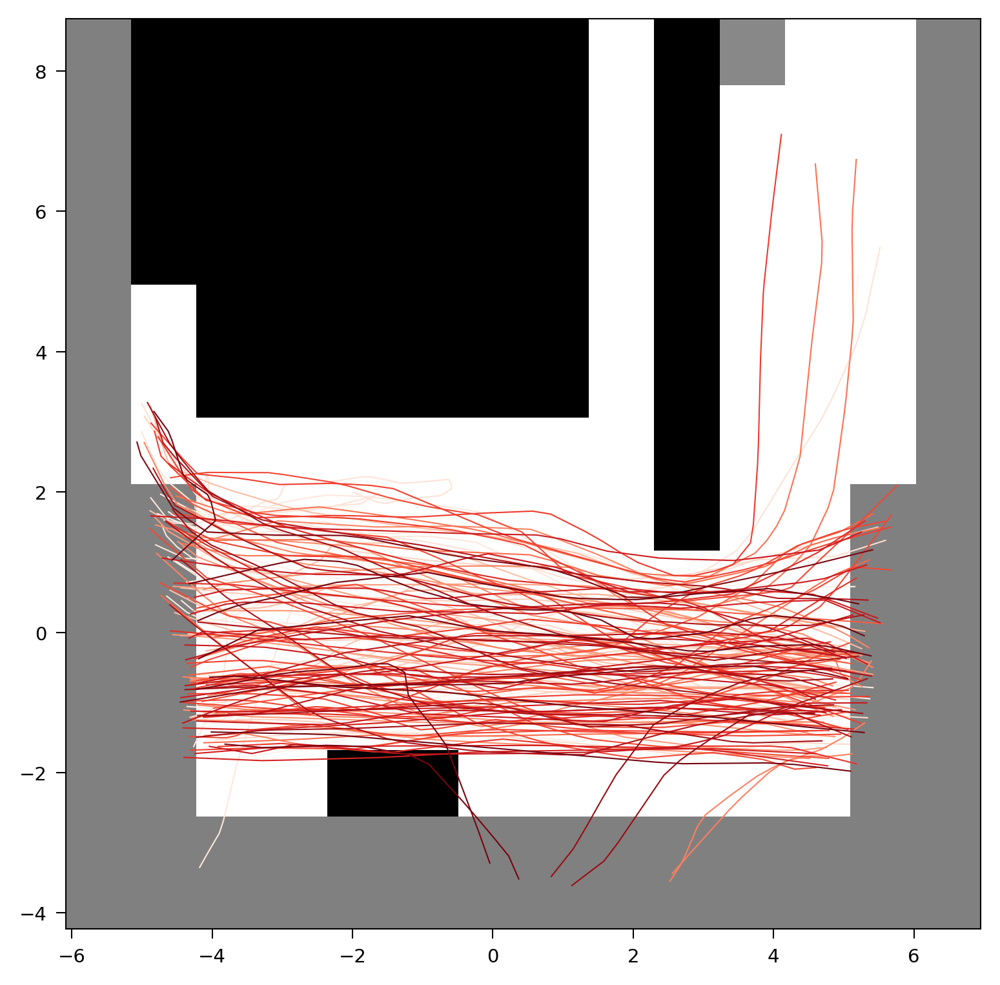

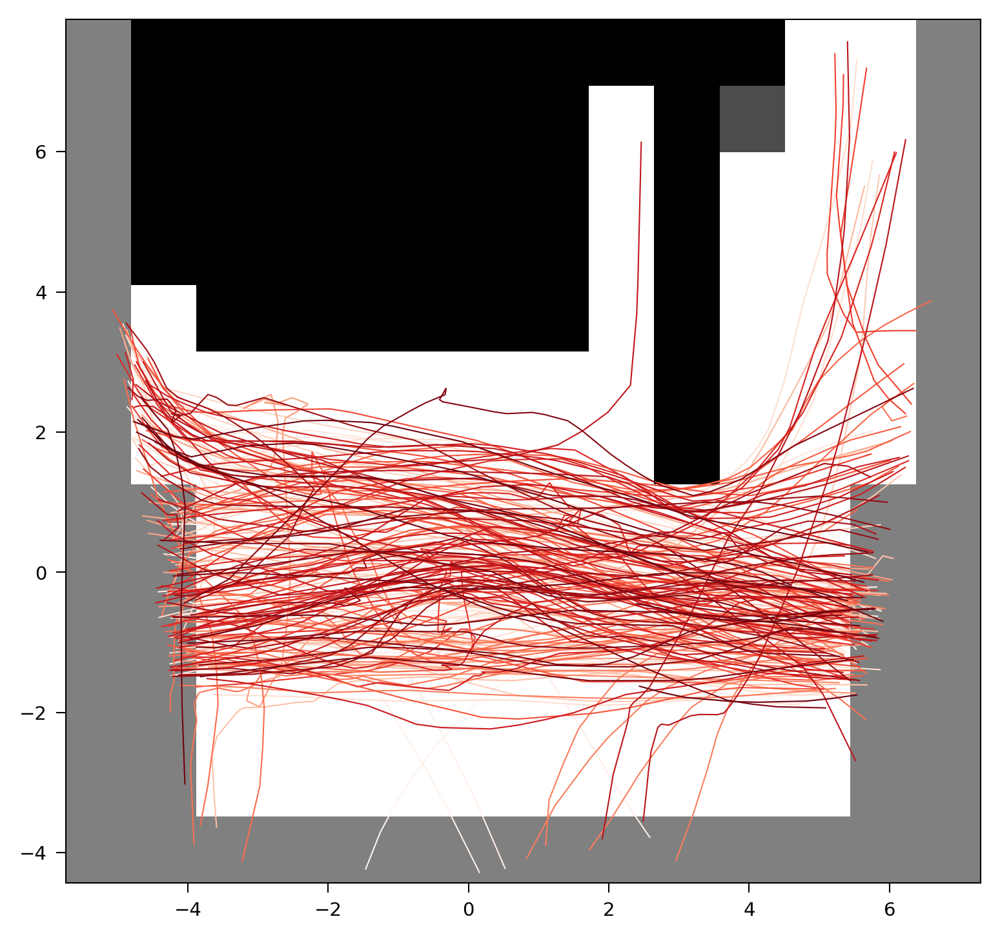

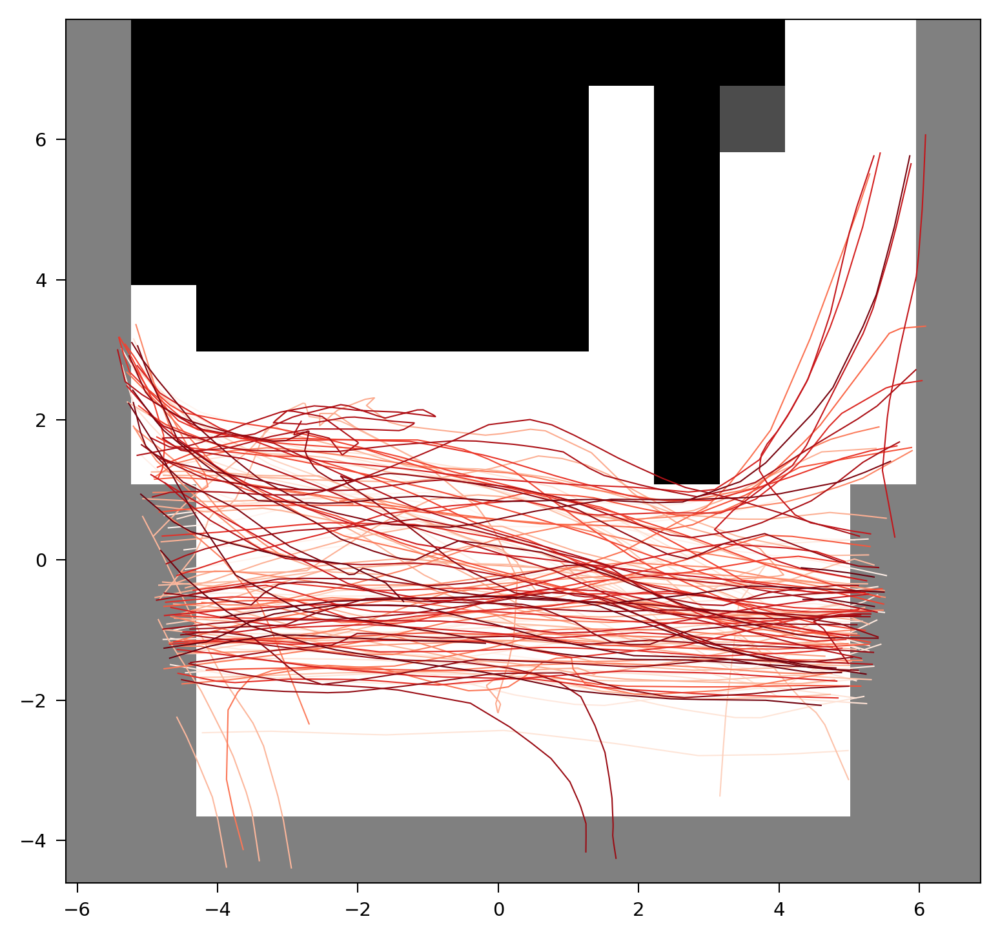

In [39]:
import matplotlib.pyplot as plt
from pathlib import Path
from argparse import Namespace
from src.dataset import UCYDataset
from src.utils.plot import get_fig
from src.utils.crop_axes_region import crop_axes_region

args = Namespace(
    fps=2.5,
    pred_step=1,
    roll_step=12,
    hist_step=8,
    skip_step=1,
    dot_per_meter=1,
    cache_dataset=True,
)
datasets = UCYDataset.load_data_batch(args, './data/UCY/')

for dataset in datasets:

    fi, fig, axes = get_fig(1, 1, AW=12, AH=12, dpi=300)
    ax = axes[0]    

    ax.set_facecolor('gray')

    map_data = dataset.map_data
    ax.imshow(
        map_data.map.T,
        extent=[map_data.xmin, map_data.xmax, map_data.ymin, map_data.ymax],
        origin='lower',
        cmap='gray_r',
        zorder=0,
    )

    df_data = dataset.df_data
    norm = plt.Normalize(vmin=df_data['f'].min(), vmax=df_data['f'].max())
    cmap = plt.get_cmap('viridis')
    for pid, group in df_data.sort_values(['id', 'f']).groupby('id'):
        assert group['type'].nunique() == 1
        if group['type'].iloc[0] == 'vehicle':
            cmap = plt.get_cmap('Blues')
        elif group['type'].iloc[0] == 'pedestrian':
            cmap = plt.get_cmap('Reds')
        else:
            cmap = plt.get_cmap('Greys')
        color = cmap(norm(group['f'].mean()))
        ax.plot(group['x'], group['y'], color=color, lw=0.5, zorder=999)

    img = crop_axes_region(ax, map_data.xmin, map_data.xmax, map_data.ymin, map_data.ymax, pad_pixels=0, dpi=800)
    img.save(Path(dataset.path).parent / 'demo.png')

AttributeError: 'GCDataset' object has no attribute 'path'

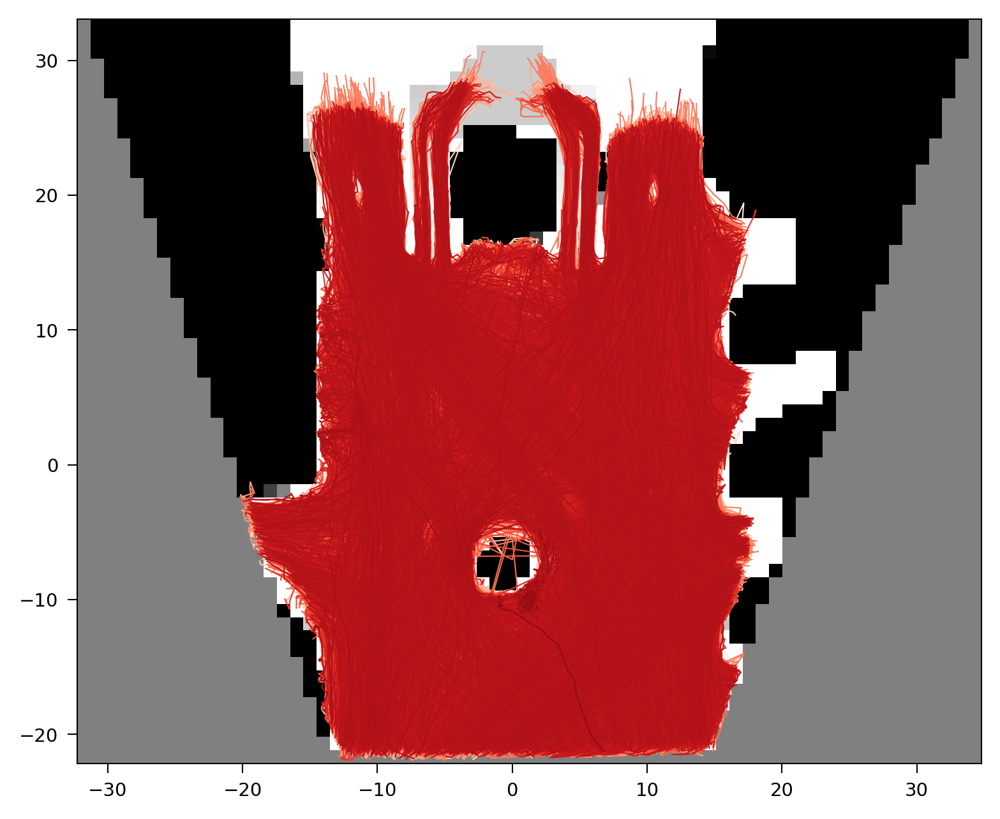

In [ ]:
import matplotlib.pyplot as plt
from src.utils.plot import get_fig
from src.utils.crop_axes_region import crop_axes_region
from src.dataset import GCDataset

args = Namespace(
    fps=2.5,
    pred_step=1,
    roll_step=12,
    hist_step=8,
    skip_step=1,
    dot_per_meter=1,
    cache_dataset=True,
)
dataset = GCDataset.load_data(args, './data/GC/Annotation')

fi, fig, axes = get_fig(1, 1, AW=12, AH=12, dpi=300)
ax = axes[0]    

ax.set_facecolor('gray')

map_data = dataset.map_data
ax.imshow(
    map_data.map.T,
    extent=[map_data.xmin, map_data.xmax, map_data.ymin, map_data.ymax],
    origin='lower',
    cmap='gray_r',
    zorder=0,
)

df_data = dataset.df_data
norm = plt.Normalize(vmin=df_data['f'].min(), vmax=df_data['f'].max())
cmap = plt.get_cmap('viridis')
for pid, group in df_data.sort_values(['id', 'f']).groupby('id'):
    assert group['type'].nunique() == 1
    if group['type'].iloc[0] == 'vehicle':
        cmap = plt.get_cmap('Blues')
    elif group['type'].iloc[0] == 'pedestrian':
        cmap = plt.get_cmap('Reds')
    else:
        cmap = plt.get_cmap('Greys')
    color = cmap(norm(group['f'].mean()))
    ax.plot(group['x'], group['y'], color=color, lw=0.5, zorder=999)

img = crop_axes_region(ax, map_data.xmin, map_data.xmax, map_data.ymin, map_data.ymax, pad_pixels=0, dpi=800)
img.save('./data/GC/demo.png')